## 读取数据

In [1]:
import pandas as pd
import numpy as np
import panel as pn
import warnings;

warnings.filterwarnings('ignore')

def show_panel(df):
    return pn.widgets.Tabulator(df.head(20),
                                show_index=False,
                                pagination='local',
                                page_size=10)

pn.extension('tabulator')
pn.widgets.Tabulator.theme = 'bootstrap'

validation = pd.read_csv('./data/validation.csv')
train = pd.read_csv('./data/training.csv')
test = pd.read_csv('./data/test.csv')

print('Dataset information:')
print(f'Training data: {train.shape}')
print(f'Validation data: {validation.shape}')
print(f'Test data: {test.shape}')

Dataset information:
Training data: (16000, 2)
Validation data: (2000, 2)
Test data: (2000, 2)


In [2]:
show_panel(train)

Tabulator(page_size=10, pagination='local', show_index=False, value=              ...)

In [3]:
from datasets import Dataset, DatasetDict, Features, Value, ClassLabel

class_names = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
ft = Features({'text': Value('string'), 'label': ClassLabel(names=class_names)})

emotions = DatasetDict({
    "train": Dataset.from_pandas(train, features=ft),
    "test": Dataset.from_pandas(test, features=ft),
    "validation": Dataset.from_pandas(validation, features=ft)
})

emotions

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 16000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 2000
    })
    validation: Dataset({
        features: ['text', 'label'],
        num_rows: 2000
    })
})

In [4]:
train_ds = emotions["train"]
train_ds

Dataset({
    features: ['text', 'label'],
    num_rows: 16000
})

In [5]:
train_ds[:5]

{'text': ['i didnt feel humiliated',
  'i can go from feeling so hopeless to so damned hopeful just from being around someone who cares and is awake',
  'im grabbing a minute to post i feel greedy wrong',
  'i am ever feeling nostalgic about the fireplace i will know that it is still on the property',
  'i am feeling grouchy'],
 'label': [0, 0, 3, 2, 3]}

In [6]:
emotions.set_format(type='pandas')
df = emotions["train"][:]
show_panel(df)

Tabulator(page_size=10, pagination='local', show_index=False, value=              ...)

In [7]:
def label_int2str(row):
    return emotions["train"].features["label"].int2str(row)


df["label_name"] = df["label"].apply(label_int2str)
show_panel(df)

Tabulator(page_size=10, pagination='local', show_index=False, value=              ...)

In [9]:
import plotly.express as px

fig = px.bar(df['label_name'].value_counts(ascending=True), template='plotly_white')
from IPython.display import HTML
HTML(fig.to_html())

In [11]:
df["Words Per Tweet"] = df["text"].str.split().apply(len)
fig2 = px.box(df, y='Words Per Tweet',
       color='label_name',
       template='plotly_white')
HTML(fig2.to_html())

## 字符标记化

In [12]:
text = 'Tokenisation of text is a core task of NLP.'
tokenised_text = list(text)
print(f"Number of tokens:{len(tokenised_text)}")
print(tokenised_text)

Number of tokens:43
['T', 'o', 'k', 'e', 'n', 'i', 's', 'a', 't', 'i', 'o', 'n', ' ', 'o', 'f', ' ', 't', 'e', 'x', 't', ' ', 'i', 's', ' ', 'a', ' ', 'c', 'o', 'r', 'e', ' ', 't', 'a', 's', 'k', ' ', 'o', 'f', ' ', 'N', 'L', 'P', '.']


In [13]:
token2idx = {ch: idx for idx, ch in enumerate(sorted(set(tokenised_text)))}

print(f"Length of vocabulary:{len(token2idx)}")
print(token2idx)

Length of vocabulary:18
{' ': 0, '.': 1, 'L': 2, 'N': 3, 'P': 4, 'T': 5, 'a': 6, 'c': 7, 'e': 8, 'f': 9, 'i': 10, 'k': 11, 'n': 12, 'o': 13, 'r': 14, 's': 15, 't': 16, 'x': 17}


## 重构文本

In [14]:
input_ids = [token2idx[token] for token in tokenised_text]

print(f"{len(input_ids)}characters")
print(input_ids)

43characters
[5, 13, 11, 8, 12, 10, 15, 6, 16, 10, 13, 12, 0, 13, 9, 0, 16, 8, 17, 16, 0, 10, 15, 0, 6, 0, 7, 13, 14, 8, 0, 16, 6, 15, 11, 0, 13, 9, 0, 3, 2, 4, 1]


In [15]:
import torch
import torch.nn.functional as F

input_ids = torch.tensor(input_ids)
one_hot_encodings = F.one_hot(input_ids, num_classes=len(token2idx))
print(f"One size: {one_hot_encodings.shape}")

One size: torch.Size([43, 18])


In [16]:
tokenised_text = text.split()
print(tokenised_text)

['Tokenisation', 'of', 'text', 'is', 'a', 'core', 'task', 'of', 'NLP.']


## 加载分词器

In [17]:
from transformers import AutoTokenizer

text = 'Tokenisation of text is a core task of NLP.'

model_ckpt = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)
tokenizer

BertTokenizerFast(name_or_path='bert-base-uncased', vocab_size=30522, model_max_length=1000000000000000019884624838656, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	100: AddedToken("[UNK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	101: AddedToken("[CLS]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	102: AddedToken("[SEP]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	103: AddedToken("[MASK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}

In [18]:
print('')
print(f'Vocab size: {tokenizer.vocab_size}')
print(f'Max length: {tokenizer.model_max_length}')
print(f'Tokeniser model input names: {tokenizer.model_input_names}')


Vocab size: 30522
Max length: 1000000000000000019884624838656
Tokeniser model input names: ['input_ids', 'token_type_ids', 'attention_mask']


In [19]:
print('Encoded text')
encoded_text = tokenizer(text)
print(encoded_text, '\n')

print('Tokens')
tokens = tokenizer.convert_ids_to_tokens(encoded_text.input_ids)
print(tokens, '\n')

print('Convert tokens to string')
print(tokenizer.convert_tokens_to_string(tokens), '\n')

Encoded text
{'input_ids': [101, 19204, 6648, 1997, 3793, 2003, 1037, 4563, 4708, 1997, 17953, 2361, 1012, 102], 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]} 

Tokens
['[CLS]', 'token', '##isation', 'of', 'text', 'is', 'a', 'core', 'task', 'of', 'nl', '##p', '.', '[SEP]'] 

Convert tokens to string
[CLS] tokenisation of text is a core task of nlp. [SEP] 



In [20]:
emotions.reset_format()

In [21]:
def tokenise(batch):
    return tokenizer(batch["text"], padding=True, truncation=True)


ex_tokenised = tokenise(emotions["train"][:2])

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


In [22]:
ex_tokenised['attention_mask']

[[1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]

In [23]:
emotions_encoded = emotions.map(tokenise, batched=True, batch_size=None)
print(emotions_encoded["train"].column_names)

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

['text', 'label', 'input_ids', 'token_type_ids', 'attention_mask']


## 加载模型

In [24]:
import warnings;

warnings.filterwarnings('ignore')
from transformers import AutoModel

model_ckpt = "bert-base-uncased"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AutoModel.from_pretrained(model_ckpt).to(device)

In [25]:
text = "This is a test"
inputs = tokenizer(text, return_tensors="pt")
print(f"Input tensor shape: {inputs['input_ids'].size()}")

Input tensor shape: torch.Size([1, 6])


In [26]:
inputs = {k: v.to(device) for k, v in inputs.items()}

with torch.no_grad():
    outputs = model(**inputs)
print(outputs)

BaseModelOutputWithPoolingAndCrossAttentions(last_hidden_state=tensor([[[-0.0260,  0.1920,  0.0344,  ..., -0.1346,  0.0773,  0.2477],
         [-0.5674, -0.2561,  0.3124,  ..., -0.7818,  0.2190,  0.5927],
         [-0.2362, -0.3177,  0.6953,  ..., -0.2110,  0.1040,  0.9891],
         [-0.1820, -0.3069,  1.0218,  ..., -0.1590,  0.0841,  1.3962],
         [ 0.0534, -0.4904, -0.0244,  ...,  0.1503,  0.1478, -0.2623],
         [ 0.7536,  0.1498, -0.2997,  ...,  0.0948, -0.8660, -0.2169]]],
       device='cuda:0'), pooler_output=tensor([[-8.1014e-01, -1.6611e-01,  6.8872e-01,  5.6120e-01, -4.2450e-01,
         -1.0617e-01,  8.4508e-01,  1.5211e-01,  4.0698e-01, -9.9904e-01,
          3.3192e-01, -2.4647e-01,  9.5928e-01, -3.5368e-01,  8.7687e-01,
         -4.3937e-01,  1.3539e-02, -4.6144e-01,  2.8962e-01, -7.3881e-01,
          4.2921e-01,  2.6882e-01,  6.9294e-01,  1.8854e-01,  2.5857e-01,
         -3.1407e-01, -3.8146e-01,  8.7916e-01,  9.1173e-01,  5.7387e-01,
         -6.2304e-01,  1.1

In [27]:
print(outputs.last_hidden_state.size())
print(outputs.last_hidden_state[:, 0].size())

torch.Size([1, 6, 768])
torch.Size([1, 768])


In [28]:
def extract_hidden_states(batch):
    inputs = {k: v.to(device) for k, v in batch.items()
              if k in tokenizer.model_input_names}

    with torch.no_grad():
        last_hidden_state = model(**inputs).last_hidden_state

    cls_hidden_state = last_hidden_state[:, 0].cpu().numpy()

    return {"hidden_state": cls_hidden_state}

In [29]:
emotions_encoded.set_format("torch", columns=["input_ids", "attention_mask", "label"])
emotions_encoded

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 16000
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 2000
    })
    validation: Dataset({
        features: ['text', 'label', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 2000
    })
})

In [30]:
emotions_hidden = emotions_encoded.map(extract_hidden_states, batched=True)
emotions_hidden["train"].column_names

Map:   0%|          | 0/16000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

['text',
 'label',
 'input_ids',
 'token_type_ids',
 'attention_mask',
 'hidden_state']

In [31]:
X_train = np.array(emotions_hidden["train"]["hidden_state"])
X_valid = np.array(emotions_hidden["validation"]["hidden_state"])
Y_train = np.array(emotions_hidden["train"]["label"])
Y_valid = np.array(emotions_hidden["validation"]["label"])
print(f"Training Dataset: {X_train.shape}")
print(f"Validation Dataset {X_valid.shape}")

Training Dataset: (16000, 768)
Validation Dataset (2000, 768)


In [32]:
X_train

array([[-0.08821988,  0.30442283, -0.2305012 , ..., -0.29480618,
         0.6574473 ,  0.39343375],
       [ 0.2553705 , -0.00810231, -0.00447348, ..., -0.32217532,
         0.25146508,  0.49700484],
       [ 0.14182408,  0.5302437 ,  0.32418555, ..., -0.44124785,
         0.51400065,  0.4017568 ],
       ...,
       [-0.03791612,  0.08918081,  0.07401013, ..., -0.39983937,
         0.833262  , -0.12905577],
       [ 0.02930646,  0.5403616 ,  0.24422365, ..., -0.08571009,
         0.593431  ,  0.3208859 ],
       [ 0.25866726,  0.18884416,  0.0313681 , ..., -0.02091435,
         0.372336  ,  0.2724969 ]], dtype=float32)

## 传统方法分析

In [33]:
import warnings;

warnings.filterwarnings('ignore')
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE

X_scaled = MinMaxScaler().fit_transform(X_train)

model = TSNE(n_components=2).fit(X_scaled)

df_embedding = pd.DataFrame(model.embedding_, columns=["X", "Y"])
df_embedding["label"] = Y_train

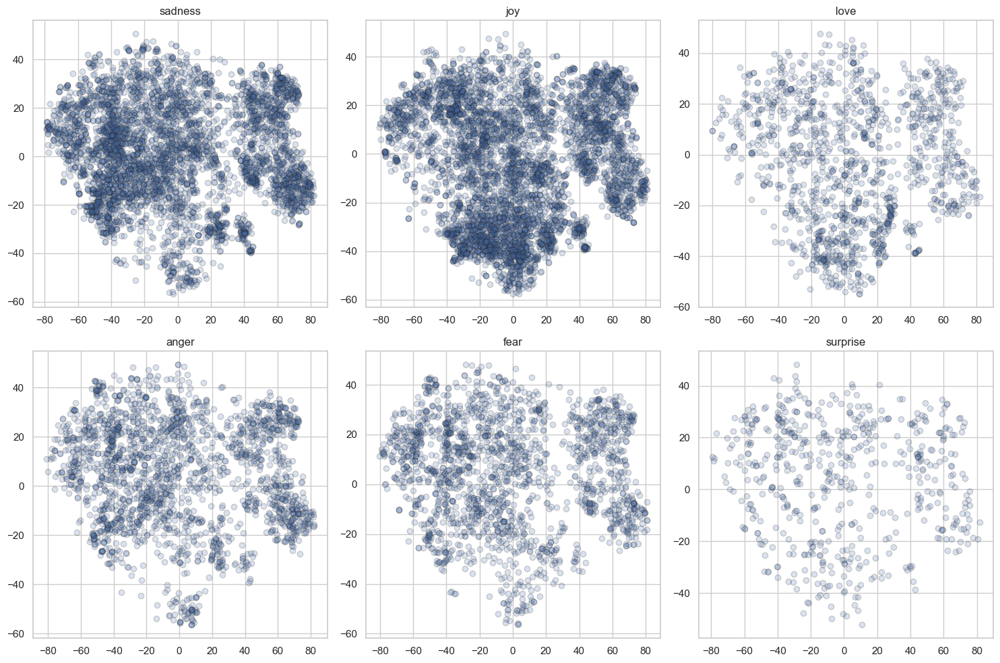

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns;

sns.set(style='whitegrid')
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()
labels = emotions["train"].features["label"].names

for i, label in enumerate(labels):
    dict_embedding_sub = dict(tuple(df_embedding.groupby('label')))
    df_embedding_sub = dict_embedding_sub[i]

    axes[i].scatter(df_embedding_sub["X"],
                    df_embedding_sub["Y"],
                    lw=1, ec='k', alpha=0.2)

    axes[i].set_title(f'{label}')

plt.tight_layout()
plt.show()

In [35]:
from sklearn.dummy import DummyClassifier

dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train, Y_train)
print(f"accuracy: {dummy_clf.score(X_valid, Y_valid)}")

accuracy: 0.352


In [36]:
from sklearn.linear_model import LogisticRegression as LR

lr_clf = LR(max_iter=2000)
lr_clf.fit(X_train, Y_train)
y_preds = lr_clf.predict(X_valid)
print(f"accuracy: {lr_clf.score(X_valid, Y_valid)}")

accuracy: 0.5965


## 混淆矩阵

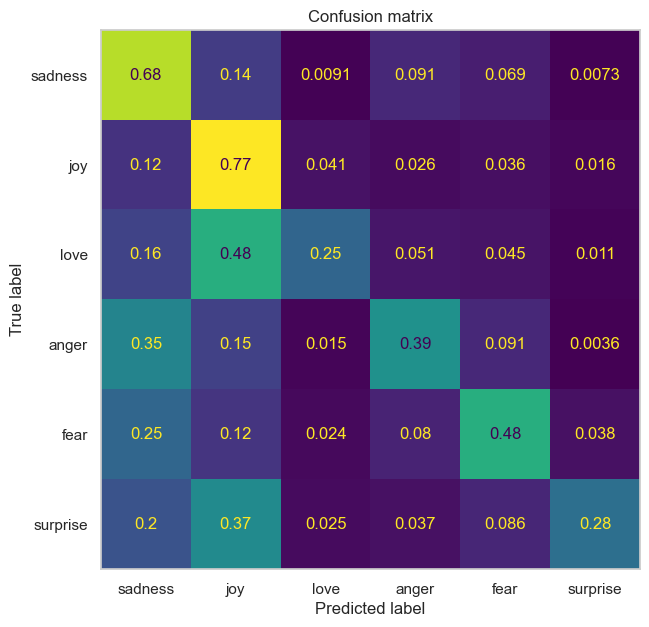

In [37]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix


def plot_confusion_matrix(y_model, y_true, labels):
    cm = confusion_matrix(y_true, y_model, normalize='true')
    fig, ax = plt.subplots(figsize=(7, 7))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(ax=ax, colorbar=False)
    plt.title("Confusion matrix")
    plt.grid(False)
    plt.show()


plot_confusion_matrix(y_preds, Y_valid, labels)

## 模型训练

In [38]:
from transformers import AutoModelForSequenceClassification

num_labels = 6
model_ckpt = "bert-base-uncased"

model = (AutoModelForSequenceClassification.from_pretrained(model_ckpt, num_labels=num_labels).to(device))

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [39]:
from sklearn.metrics import accuracy_score, f1_score


def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    f1 = f1_score(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc, "f1": f1}

In [40]:
from transformers import Trainer, TrainingArguments

bs = 64
logging_steps = len(emotions_encoded["train"])
model_name = f"{model_ckpt}-finetuned-emotion"
training_args = TrainingArguments(
    output_dir=model_name,
    num_train_epochs=3,
    learning_rate=2e-5,
    per_device_train_batch_size=bs,
    per_device_eval_batch_size=bs,
    weight_decay=0.01,
    evaluation_strategy="epoch",
    disable_tqdm=False,
    report_to="none",
    logging_steps=logging_steps,
    push_to_hub=False,
    log_level="error"
)

In [40]:
from transformers import Trainer

trainer = Trainer(model=model, args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=emotions_encoded["train"],
                  eval_dataset=emotions_encoded["validation"],
                  tokenizer=tokenizer)
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,No log,0.289953,0.912000,0.913411
2,No log,0.176971,0.931500,0.931429
3,No log,0.163723,0.933500,0.933510


TrainOutput(global_step=750, training_loss=0.36639131673177083, metrics={'train_runtime': 1594.4657, 'train_samples_per_second': 30.104, 'train_steps_per_second': 0.47, 'total_flos': 2146076617536000.0, 'train_loss': 0.36639131673177083, 'epoch': 3.0})

In [41]:
pred_output = trainer.predict(emotions_encoded["validation"])
pred_output

NameError: name 'trainer' is not defined

In [42]:
print(f'Output Predition: {pred_output.predictions.shape}')
print(pred_output.predictions)

Output Predition: (2000, 6)
[[ 5.4159102  -1.0719217  -1.1042502  -1.283962   -1.2187817  -1.9086131 ]
 [ 5.315981   -0.65038335 -1.597509   -1.2950553  -1.1209468  -1.6280532 ]
 [-1.2478473   3.3535733   3.5493345  -1.3168634  -2.5220885  -1.5885268 ]
 ...
 [-1.7481323   5.7265286  -0.38497296 -1.9018835  -2.1443737  -1.0455638 ]
 [-2.0507166   3.853601    3.1511908  -1.238694   -2.4608855  -1.0977302 ]
 [-1.9679908   5.630336   -0.69896007 -1.8289104  -2.0622072  -0.39735994]]


In [43]:
y_preds = np.argmax(pred_output.predictions, axis=1)
print(f'Output Prediction:{y_preds.shape}')
print(f'Predictions: {y_preds}')

Output Prediction:(2000,)
Predictions: [0 0 2 ... 1 1 1]


In [44]:
pred_output.metrics

{'test_loss': 0.16372326016426086,
 'test_accuracy': 0.9335,
 'test_f1': 0.9335097916758399,
 'test_runtime': 10.5218,
 'test_samples_per_second': 190.081,
 'test_steps_per_second': 3.041}

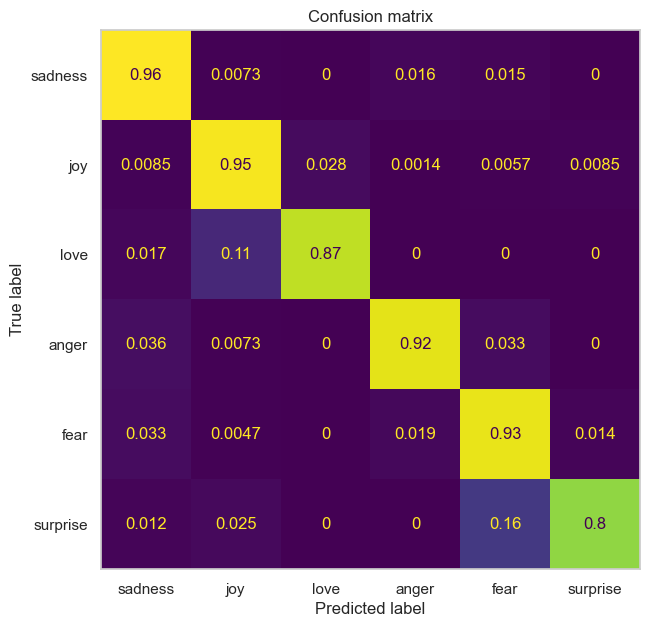

In [46]:
plot_confusion_matrix(y_preds, Y_valid, labels)

In [47]:
def forward_pass_with_label(batch):
    inputs = {k: v.to(device) for k, v in batch.items()
              if k in tokenizer.model_input_names}

    with torch.no_grad():
        output = model(**inputs)
        pred_label = torch.argmax(output.logits, axis=-1)
        loss = torch.nn.functional.cross_entropy(output.logits,batch["label"].to(device),reduction="none")
        
    return {"loss":loss.cpu().numpy(),"predicted_label":pred_label.cpu().numpy()}

emotions_encoded.set_format("torch",columns=["input_ids", "attention_mask", "label"])
emotions_encoded["validation"] = emotions_encoded["validation"].map(forward_pass_with_label,batched=True,batch_size=16)

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

In [48]:
emotions_encoded.set_format("pandas")
cols = ["text","label","predicted_label","loss"]
df_test = emotions_encoded["validation"][:][cols]
df_test["label"] = df_test["label"].apply(label_int2str)
df_test["predicted_label"] = (df_test["predicted_label"].apply(label_int2str))

In [52]:
show_panel(df_test.sort_values("loss", ascending=False))

Tabulator(page_size=10, pagination='local', show_index=False, value=              ...)

In [53]:
show_panel(df_test.sort_values("loss", ascending=True))

Tabulator(page_size=10, pagination='local', show_index=False, value=              ...)

In [54]:
trainer.save_model()

In [42]:
from transformers import pipeline

classifier = pipeline("text-classification",model="bert-base-uncased-finetuned-emotion")

new_data = 'I watched a movie last night, it was quite brilliant'

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


In [43]:
preds = classifier(new_data,return_all_scores=True)
preds = preds[0]
preds

[{'label': 'LABEL_0', 'score': 0.002388840075582266},
 {'label': 'LABEL_1', 'score': 0.9911893606185913},
 {'label': 'LABEL_2', 'score': 0.0013347273925319314},
 {'label': 'LABEL_3', 'score': 0.0014594522072002292},
 {'label': 'LABEL_4', 'score': 0.0008959448896348476},
 {'label': 'LABEL_5', 'score': 0.002731578890234232}]

In [44]:
preds[0]

{'label': 'LABEL_0', 'score': 0.002388840075582266}

In [45]:
df_preds = pd.DataFrame(preds)
df_preds

,label,score
0,LABEL_0,0.002389
1,LABEL_1,0.991189
2,LABEL_2,0.001335
3,LABEL_3,0.001459
4,LABEL_4,0.000896
5,LABEL_5,0.002732


In [46]:
fig3 = px.bar(x=labels,y=100*df_preds['score'],template='plotly_white')
HTML(fig3.to_html())